In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import fsolve, root_scalar
import scipy.special as sp
import IGM

r0 = 2.818e-13 # classical electron radius in cm
m_e = 9.10938e-28 # electron mass in gram
c = 2.998e10 # speed of light in cm/s
h = 6.6261e-27 # planck constant in cm^2 g s-1
eV_to_erg = 1.6022e-12
parsec_to_cm = 3.085677581e18 # cm per parsec

kB = 1.3808e-16 # boltzmann constant in cm^2 g s^-2 K^-1
T_CMB = 2.725 # CMB temperature today in K

H_0 = 2.184e-18 # current hubble constant in s^-1
H_r = 3.24076e-18 # 100 km/s/Mpc to 1/s
h_0 = H_0 / H_r
omega_b_0 = 0.0224 / h_0 / h_0  # current baryon abundance
m_p = 1.67262193269e-24 # proton mass in g
G = 6.6743e-8 # gravitational constant in cm^3 g^-1 s^-2
f_He = 0.079 # helium mass fraction
f_H = 0.76 # hydrogen fraction
Y_He = 0.24

E_e = m_e * c * c
rho_crit = 3 * H_0 * H_0 / 8 / np.pi / G
e = 4.80326e-10 # electron charge in esu

z = 2
z2 = (1 + z) / 3
T_CMB *= 1 + z 

T_IGM = 10775.81 # IGM temperature at z = 2 in K

In [2]:
omega_b = omega_b_0 * (1 + z)**3
mean_n_b = 3 * omega_b * H_0 * H_0 / (8 * np.pi * G * m_p) # mean number density of baryons at the redshift
n_b = mean_n_b # for mean density
    
n_H = n_b * (1 - Y_He) # nuclei in hydrogen
n_He = n_H * f_He # nuclei in helium, assume He is all 4He

n_e = n_H + 2 * n_He # for fully ionized

In [3]:
omega_p = c * np.sqrt(4 * np.pi * r0 * n_e)
Npoints = 100
k = omega_p/c*np.exp(.01*np.sinh(7.5*(np.linspace(0,1,Npoints)-.3))) # for final version, can have Npoints = 100
theta_deg = np.array([10, 45, 80])
theta_rad = np.radians(theta_deg)

In [4]:
print(omega_p/c, k[0], theta_rad[0])

4.6007454504527044e-09 4.389900939300635e-09 0.17453292519943295


In [5]:
n = n_e + n_H + n_He

B = np.sqrt(8 * np.pi * kB * T_IGM * n) # equipartion field

omega_c = e * B / (m_e * c)

In [6]:
print(B, omega_c)

2.077981960178551e-08 0.36547478633619185


In [7]:
def dispersion(omega, k, theta_rad):
    res = omega**2 - omega_p**2 / (1 - omega_c**2 / omega**2) - c**2 * k**2 * np.cos(theta_rad)**2 - 1 / (1 - omega_c**2 / omega**2) * omega_c**2 * omega_p**4 / ((omega**2 - c**2 * k**2) * (omega**2 - omega_c**2) - omega_p**2 * omega**2) - c**4 * k**4 * np.sin(theta_rad)**2 * np.cos(theta_rad)**2 / (omega**2 - omega_p**2 - c**2 * k**2 * np.sin(theta_rad)**2)
    return res

In [8]:
# grid has shape (len(k), len(angle)), same row same k, same col same angle
omega = np.zeros((len(k), len(theta_rad)))

for i in range(len(k)):
    for j in range(len(theta_rad)):
        dispersion_fixed = lambda omega: dispersion(omega, k[i], theta_rad[j])
        #initial_guess = omega_p/10
        #omega[i][j] = fsolve(dispersion_fixed, initial_guess)[0]
        omega[i][j] = root_scalar(dispersion_fixed, method='bisect', bracket=[.998*omega_p, 1.002*omega_p]).root

In [9]:
print(omega_p)
print(omega)
print(np.amin(omega)/omega_p, np.amax(omega)/omega_p)

137.9303486045721
[[137.93034717 137.93032479 137.93030241]
 [137.93034728 137.93032665 137.93030601]
 [137.93034738 137.93032836 137.93030933]
 [137.93034748 137.93032994 137.9303124 ]
 [137.93034757 137.9303314  137.93031524]
 [137.93034765 137.93033275 137.93031786]
 [137.93034772 137.930334   137.93032028]
 [137.93034779 137.93033516 137.93032253]
 [137.93034786 137.93033624 137.93032462]
 [137.93034792 137.93033723 137.93032655]
 [137.93034797 137.93033816 137.93032835]
 [137.93034803 137.93033902 137.93033002]
 [137.93034808 137.93033983 137.93033158]
 [137.93034812 137.93034058 137.93033304]
 [137.93034816 137.93034128 137.9303344 ]
 [137.9303482  137.93034194 137.93033567]
 [137.93034824 137.93034255 137.93033687]
 [137.93034827 137.93034313 137.93033799]
 [137.93034831 137.93034368 137.93033905]
 [137.93034834 137.9303442  137.93034005]
 [137.93034837 137.93034469 137.930341  ]
 [137.9303484  137.93034515 137.93034191]
 [137.93034842 137.9303456  137.93034277]
 [137.93034845 1

In [10]:
test = np.zeros((len(k), len(theta_rad)))
for i in range(len(k)):
    for j in range(len(theta_rad)):
        test[i][j] = dispersion(omega[i][j], k[i], theta_rad[j])
        
print(np.min(test), np.max(test))

-1.818261807784438e-08 1.830994733609259e-08


In [11]:
def get_eigen(omega, k, theta_rad):
    zeta_x = np.sin(theta_rad) # for now, as zeta will be canceled out later
    zeta_y = 1j * omega_c * omega_p**2 * omega / ((omega**2 - c**2 * k**2) * (omega**2 - omega_c**2) - omega_p**2 * omega**2) * zeta_x
    zeta_z = -c**2 * k**2 * np.sin(theta_rad) * np.cos(theta_rad) / (omega**2 - omega_p**2 - c**2 * k**2 * np.sin(theta_rad)**2) * zeta_x
    return zeta_x, zeta_y, zeta_z

In [12]:
def get_D(i, j):
    omega_ij = omega[i][j]
    zeta_x, zeta_y, zeta_z = get_eigen(omega_ij, k[i], theta_rad[j])
    mag2_zeta = zeta_x**2 + np.abs(zeta_y)**2 + zeta_z**2
    
    add1 = 2 * omega_ij * mag2_zeta
    co1 = omega_p**2 * omega_c**2 / (omega_ij**3 * (1 - omega_c**2 / omega_ij**2)**2)
    co2 = 2 * (zeta_x**2 + np.abs(zeta_y)**2) + 2*zeta_x*zeta_y.imag / omega_c * omega_ij * (1 + omega_c**2 / omega_ij**2)
    return add1 + co1 * co2 # co2 is always xxx + 0j, only real part make sense

In [13]:
D = np.zeros((len(k), len(theta_rad)))
for i in range(len(k)):
    for j in range(len(theta_rad)):
        D[i][j] = get_D(i, j)

In [14]:
print(2*omega_p)
print(D)

275.8606972091442
[[275.86035316 275.86151335 275.86267355]
 [275.8603871  275.86152589 275.86266469]
 [275.86041803 275.86153736 275.8626567 ]
 [275.86044626 275.86154787 275.86264948]
 [275.86047206 275.8615575  275.86264294]
 [275.86049568 275.86156635 275.86263701]
 [275.86051735 275.86157448 275.86263161]
 [275.86053724 275.86158197 275.8626267 ]
 [275.86055553 275.86158888 275.86262222]
 [275.86057239 275.86159525 275.86261812]
 [275.86058794 275.86160115 275.86261436]
 [275.86060231 275.86160661 275.86261091]
 [275.86061562 275.86161168 275.86260773]
 [275.86062797 275.86161639 275.86260481]
 [275.86063944 275.86162077 275.8626021 ]
 [275.86065014 275.86162487 275.8625996 ]
 [275.86066012 275.86162869 275.86259727]
 [275.86066947 275.86163228 275.8625951 ]
 [275.86067824 275.86163565 275.86259307]
 [275.8606865  275.86163884 275.86259117]
 [275.86069431 275.86164184 275.86258938]
 [275.86070171 275.8616447  275.86258769]
 [275.86070876 275.86164742 275.86258609]
 [275.8607155  2

In [15]:
IGM_00 = IGM.IGM_N(0,0) # mean density
#n_CRe = IGM_00.back_Euler() # number density of CRe, shape (399, 399)
E = IGM.E
gamma = E / E_e + 1

In [ ]:
np.save('n_CRe.npy', n_CRe)

In [16]:
n_CRe = np.load('n_CRe.npy')

In [17]:
v = c * np.sqrt(E * (E + 2 * E_e)) / (E + E_e) # shape (400, )
p = gamma * m_e * v # shape (400, )
omega_s = omega_c / gamma # shape (400, )

In [18]:
print(IGM_00.z[240], IGM_00.z[120])
n_CRe_z2 = n_CRe[:, 240] # number density of CRe at z = 2, shape (399,)
fCR = n_CRe_z2/(IGM.E_plus-IGM.E_minus)[1:,0]/4./np.pi/p[1:]/(m_e+E[1:]/c**2)
print(np.shape(n_CRe_z2), np.shape(IGM.E_plus), np.shape(fCR))
n_CRe_z2 = np.insert(n_CRe_z2, 0, 0) # insert 0 at beginning for calculation, shape (400, )
fCR = np.insert(fCR, 0, 0) # insert 0 at beginning for calculation, shape (400, )

2.0083681725319145 5.925838073724545
(399,) (400, 1) (399,)


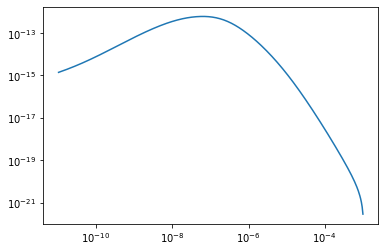

In [19]:
plt.plot(IGM.E[1:], 4.*np.pi*p[1:]**3*np.log(10)*fCR[1:])
plt.yscale('log')
plt.xscale('log')
plt.show()

In [20]:
def get_n_Bessel(omega, k_para, omega_s, v_):
    # cos(alpha) = (omega - n * omega_s) / k_parallel / v
    n_b1 = (omega - k_para * v_) / omega_s
    n_b2 = (omega + k_para * v_) / omega_s
    
    lower_bound = int(min(n_b1, n_b2)) + 1
    upper_bound = int(max(n_b1, n_b2))
    
    #print((omega - n_b1 * omega_s) / k_para / c)
    #print((omega - n_b2 * omega_s) / k_para / c)
    
    return np.array(range(lower_bound, upper_bound + 1))

In [21]:
uu_ = get_n_Bessel(omega[0][0], k[0]*np.cos(theta_rad[0]), omega_s[0], v[0])
print(omega[0][0], k[0]*np.cos(theta_rad[0]), omega_s[0], v[0], uu_[0], uu_[-1])

137.9303471683895 4.32320847997884e-09 0.3654703225843708 148172159.3538325 376 379


In [22]:
def get_Bessel(omega, n_Bessel, omega_s, k_para, k_orth, k, theta_rad, v_):
    cosa = (omega - n_Bessel * omega_s) / k_para / v_
    sina = np.sqrt(1 - cosa**2)
    
    z_Bessel = k_orth * v_ * sina / omega_s
    #print(z_Bessel)
    Jnz = sp.jv(n_Bessel, z_Bessel)
    Jnz_p = sp.jvp(n_Bessel, z_Bessel, n=1)
    
    zeta_x, zeta_y, zeta_z = get_eigen(omega, k, theta_rad)
    
    res_v = n_Bessel / z_Bessel * Jnz * zeta_x * sina + Jnz * zeta_z * cosa + Jnz_p * zeta_y / 1j * sina
    #print(res_v)
    res = res_v.real**2
    #print(res)
    
    return res

In [24]:
def get_int(i, j):
    k_para = k[i] * np.cos(theta_rad[j])
    k_orth = k[i] * np.sin(theta_rad[j])
    
    int_sum = 0
    for pi in range(len(p)-1):
        Delta = omega_s[pi] / (np.abs(k_para) * c)
        co1 = p[pi]**2 * (fCR[pi+1] - fCR[pi]) * m_e * c * Delta / omega_s[pi]
        
        n_Bessel = get_n_Bessel(omega[i][j], k_para, omega_s[pi], v[pi])
        if np.size(n_Bessel)>0:
            sum_Bessel = sum(get_Bessel(omega[i][j], ni_Bessel, omega_s[pi], k_para, k_orth, k[i], theta_rad[j], v[pi]) for ni_Bessel in n_Bessel)
            int_sum = int_sum + co1 * sum_Bessel
            print(pi, co1 * sum_Bessel, k[i]*v[pi]/omega[i,j], k_orth*v[pi]/omega_s[pi], n_Bessel.shape, n_Bessel[0], n_Bessel[-1])
        
    return int_sum

In [25]:
def get_damp_rate(i, j):
    res = 2 * np.pi**2 * omega_p**2 * omega[i][j] / (D[i][j] * n_e) * get_int(i,j)
    return res

In [121]:
print(get_damp_rate(2, 0)) # k = 1.1 omega_p/c, theta = 5 degree

0 0.0 0.005436603557105346 0.1930584454276291 (4,) 406 409
1 -0.0 0.005563556971445411 0.19756678384110357 (4,) 406 409
2 -0.0 0.005693474835235818 0.20218040322936148 (4,) 406 409
3 -0.0 0.0058264263620595265 0.20690176226523607 (4,) 406 409
4 -0.0 0.005962482380890632 0.21173337704711173 (4,) 406 409
5 -0.0 0.00610171537375348 0.21667782244068368 (5,) 405 409
6 -0.0 0.006244199514256529 0.22173773345210163 (5,) 405 409
7 -0.0 0.006390010707021165 0.22691580663323654 (6,) 405 410
8 -0.0 0.006539226628026144 0.2322148015198294 (6,) 405 410
9 -0.0 0.0066919267658883804 0.2376375421032851 (6,) 405 410
10 -0.0 0.0068481924641018285 0.24318691833691097 (6,) 405 410
11 -0.0 0.007008106964256222 0.24886588767740328 (6,) 405 410
12 -0.0 0.007171755450258117 0.2546774766624116 (6,) 405 410
13 -0.0 0.007339225093577296 0.26062478252503485 (6,) 405 410
14 -0.0 0.007510605099541712 0.2667109748461079 (6,) 405 410
15 -0.0 0.007685986754705002 0.27293929724517424 (6,) 405 410
16 -0.0 0.007865463475

In [122]:
print(get_damp_rate(2, 2)) # k = 1.1 omega_p/c, theta = 85 degree

39 -0.0 0.013374722644652509 5.429016559833353 (1,) 407 407
40 -0.0 0.013687013944274278 5.555800061654205 (1,) 407 407
41 -0.0 0.014006595314427854 5.685544565646607 (1,) 407 407
42 -0.0 0.014333636808891062 5.818319242215819 (1,) 407 407
43 -0.0 0.014668312439334837 5.954194878826141 (1,) 407 407
44 -0.0 0.01501080026680126 6.09324391789075 (2,) 407 408
45 -0.0 0.015361282495250183 6.2355404955556315 (2,) 407 408
46 -0.0 0.015719945567217473 6.381160481398949 (2,) 407 408
47 -0.0 0.016086980261629132 6.530181519068055 (2,) 407 408
48 -0.0 0.016462581793816402 6.682683067876852 (2,) 407 408
49 -0.0 0.01684694991777667 6.838746445386558 (2,) 407 408
50 -0.0 0.01724028903072671 6.998454870993892 (2,) 407 408
51 -0.0 0.017642808279994728 7.16189351055104 (2,) 407 408
52 -0.0 0.018054721672298324 7.3291495220424485 (2,) 407 408
53 -0.0 0.018476248185456793 7.500312102344433 (2,) 407 408
54 -0.0 0.018907611882585374 7.675472535093685 (2,) 407 408
55 -0.0 0.019349042028820825 7.854724239692

In [26]:
import time

damp_rate = np.zeros((len(k), len(theta_rad)))
time_start = time.time()
for j in range(len(theta_rad)):
    for i in range(len(k)):
        print(f'i = {i}, j = {j}, {(time.time() - time_start)/60}')
        damp_rate[i][j] = get_damp_rate(i, j)
        np.save('damp_rate.npy', damp_rate)

i = 0, j = 0, 4.97897466023763e-06
0 0.0 0.004715866485360836 0.30905761136615384 (4,) 376 379
1 -0.0 0.004825989532884868 0.3162747848920901 (4,) 376 379
2 -0.0 0.0049386840292305 0.3236604974659649 (4,) 376 379
3 -0.0 0.005054010012252757 0.33121868505417074 (4,) 376 379
4 -0.0 0.005172028921043462 0.33895337555279315 (4,) 376 379
5 -0.0 0.005292803628597821 0.346868690935567 (4,) 376 379
6 -0.0 0.005416398475239818 0.35496884945207363 (4,) 376 379
7 -0.0 0.0055428793028238985 0.3632581678773616 (4,) 376 379
8 -0.0 0.005672313489730897 0.37174106381420763 (4,) 376 379
9 -0.0 0.005804769986676192 0.3804220580492378 (4,) 376 379
10 -0.0 0.005940319353348916 0.389305776964189 (4,) 376 379
11 -0.0 0.006079033795901145 0.39839695500359834 (4,) 376 379
12 -0.0 0.006220987205306499 0.40770043720024657 (4,) 376 379
13 -0.0 0.006366255196608176 0.41722118175972395 (4,) 376 379
14 -0.0 0.006514915149076523 0.4269642627054937 (5,) 375 379
15 -0.0 0.006667046247296979 0.4369348725858852 (5,) 375

In [27]:
#same row same k, same col same theta
#k = omega_p / c * np.array([1.01, 1.05, 1.1, 1.5, 2]) # wave number
#theta_deg = np.array([5, 45, 85])
#theta_rad = np.radians(theta_deg)

print(damp_rate)

[[-1.27760963e-135 -8.62062429e-047 -1.85171641e-036]
 [-1.42348826e-127 -4.20272049e-044 -1.67682348e-034]
 [-5.73664801e-120 -1.33434531e-041 -1.10445177e-032]
 [-8.80289279e-113 -2.84353051e-039 -5.41481267e-031]
 [-5.40726514e-106 -4.18401849e-037 -2.01911539e-029]
 [-1.39585005e-099 -4.36519367e-035 -5.84279429e-028]
 [-1.58753538e-093 -3.31050748e-033 -1.33696847e-026]
 [-8.32813496e-088 -1.86808095e-031 -2.46195550e-025]
 [-2.10687452e-082 -8.01677236e-030 -3.70860179e-024]
 [-2.68374733e-077 -2.67056191e-028 -4.64038311e-023]
 [-1.79487535e-072 -7.03952949e-027 -4.89234207e-022]
 [-6.56363021e-068 -1.49499515e-025 -4.40452168e-021]
 [-1.36510459e-063 -2.60148689e-024 -3.42864118e-020]
 [-1.67757230e-059 -3.76847556e-023 -2.33484873e-019]
 [-1.26409638e-055 -4.61238098e-022 -1.40622776e-018]
 [-6.05457059e-052 -4.83680584e-021 -7.56758552e-018]
 [-1.90881557e-048 -4.40308043e-020 -3.67389840e-017]
 [-4.09800254e-045 -3.52261649e-019 -1.62355207e-016]
 [-6.19240529e-042 -2.505578

In [28]:
damp_rate = np.load('damp_rate.npy')
rate0 = np.array([-1.13839691e-11, -1.58882217e-10, -4.77150036e-10, -8.74881180e-10,
 -1.36525698e-09, -2.12136353e-09, -2.82314289e-09, -3.74834429e-09,
 -4.28614853e-09, -5.67328596e-09, -6.47717036e-09, -8.53336308e-09,
 -9.72630056e-09, -1.10749018e-08, -1.44816365e-08, -1.64526413e-08,
 -1.86708623e-08, -2.11644107e-08, -2.39646594e-08, -2.71026599e-08,
 -3.49225870e-08, -3.93725386e-08, -4.43333830e-08, -4.98537770e-08,
 -5.59832619e-08, -6.27805139e-08, -7.03010914e-08, -7.86044135e-08,
 -8.77569434e-08, -1.10420029e-07, -1.22804382e-07, -1.36343719e-07,
 -1.51114172e-07, -1.67189561e-07, -1.84621316e-07, -2.28075896e-07,
 -2.50736439e-07, -2.75072892e-07, -3.01120730e-07, -3.66764539e-07,
 -3.99470107e-07, -4.33981089e-07, -5.22338618e-07, -5.64248202e-07,
 -6.07732632e-07, -7.22296797e-07, -7.72880672e-07, -9.09476295e-07,
 -9.66130518e-07, -1.12494736e-06, -1.18536737e-06, -1.36464164e-06,
 -1.55959210e-06, -1.76919408e-06, -1.82816110e-06, -2.04614858e-06,
 -2.27091373e-06, -2.49860607e-06, -2.72411293e-06, -2.94205527e-06,
 -3.38209786e-06, -3.57217470e-06, -3.73284383e-06, -4.11458992e-06,
 -4.45899669e-06, -4.48310644e-06, -4.70833957e-06, -4.85824858e-06,
 -5.17335424e-06, -5.13671717e-06])

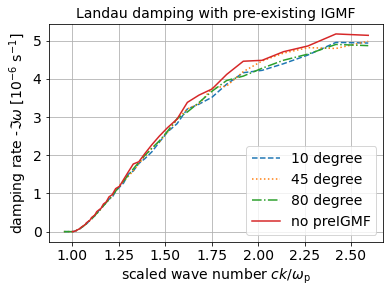

In [30]:
plt.plot(c*k/omega_p, -damp_rate[:, 0]*1e6, '--', label='10 degree')
plt.plot(c*k/omega_p, -damp_rate[:, 1]*1e6, ':', label='45 degree')
plt.plot(c*k/omega_p, -damp_rate[:, 2]*1e6, '-.', label='80 degree')
plt.plot(c*k[30:]/omega_p, -rate0*1e6, '-', label='no preIGMF')
plt.legend(loc='lower right', fontsize=14)
#plt.xlim([1, 1.5])
#plt.yscale('log')
plt.grid(True)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.ylabel('damping rate -$\Im \omega$ [$10^{-6}\ \mathrm{s^{-1}}$]', fontsize=14)
plt.xlabel('scaled wave number $ck/\omega_{\mathrm{p}}$', fontsize=14)
plt.title('Landau damping with pre-existing IGMF', fontsize=14)
plt.savefig('preIGMF.pdf')
plt.show()

In [10]:
print(rate0)

[-1.13839691e-11 -1.58882217e-10 -4.77150036e-10 -8.74881180e-10
 -1.36525698e-09 -2.12136353e-09 -2.82314289e-09 -3.74834429e-09
 -4.28614853e-09 -5.67328596e-09 -6.47717036e-09 -8.53336308e-09
 -9.72630056e-09 -1.10749018e-08 -1.44816365e-08 -1.64526413e-08
 -1.86708623e-08 -2.11644107e-08 -2.39646594e-08 -2.71026599e-08
 -3.49225870e-08 -3.93725386e-08 -4.43333830e-08 -4.98537770e-08
 -5.59832619e-08 -6.27805139e-08 -7.03010914e-08 -7.86044135e-08
 -8.77569434e-08 -1.10420029e-07 -1.22804382e-07 -1.36343719e-07
 -1.51114172e-07 -1.67189561e-07 -1.84621316e-07 -2.28075896e-07
 -2.50736439e-07 -2.75072892e-07 -3.01120730e-07 -3.66764539e-07
 -3.99470107e-07 -4.33981089e-07 -5.22338618e-07 -5.64248202e-07
 -6.07732632e-07 -7.22296797e-07 -7.72880672e-07 -9.09476295e-07
 -9.66130518e-07 -1.12494736e-06 -1.18536737e-06 -1.36464164e-06
 -1.55959210e-06 -1.76919408e-06 -1.82816110e-06 -2.04614858e-06
 -2.27091373e-06 -2.49860607e-06 -2.72411293e-06 -2.94205527e-06
 -3.38209786e-06 -3.57217

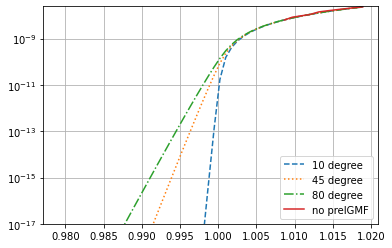

In [26]:
plt.plot(c*k[10:49]/omega_p, -damp_rate[10:49, 0], '--', label='10 degree')
plt.plot(c*k[10:49]/omega_p, -damp_rate[10:49, 1], ':', label='45 degree')
plt.plot(c*k[10:49]/omega_p, -damp_rate[10:49, 2], '-.', label='80 degree')
plt.plot(c*k[40:49]/omega_p, -rate0[10:19], '-', label='no preIGMF')
plt.legend(loc='lower right')
#plt.xlim([1, 1.2])
plt.ylim(bottom=1e-17)
plt.yscale('log')
plt.grid(True)
plt.show()

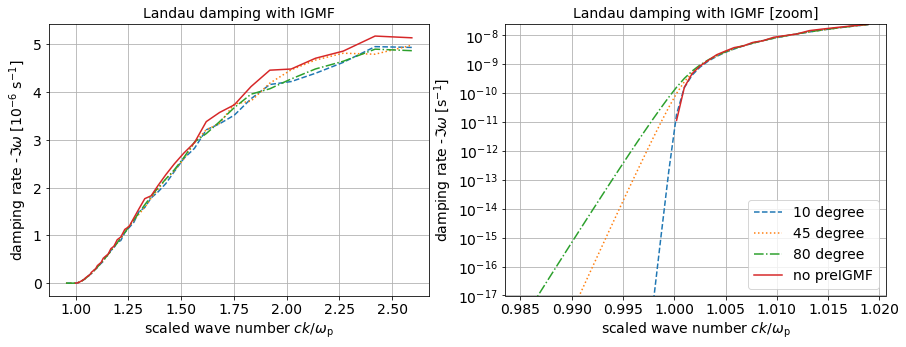

In [32]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))

ax[0].plot(c*k/omega_p, -damp_rate[:, 0]*1e6, '--', label='10 degree')
ax[0].plot(c*k/omega_p, -damp_rate[:, 1]*1e6, ':', label='45 degree')
ax[0].plot(c*k/omega_p, -damp_rate[:, 2]*1e6, '-.', label='80 degree')
ax[0].plot(c*k[30:]/omega_p, -rate0*1e6, '-', label='no preIGMF')
#ax[0].legend(loc='lower right', fontsize=14)
ax[0].grid(True)
ax[0].tick_params(axis='x', labelsize=14)
ax[0].tick_params(axis='y', labelsize=14)
ax[0].set_ylabel('damping rate -$\Im \omega$ [$10^{-6}\ \mathrm{s^{-1}}$]', fontsize=14)
ax[0].set_xlabel('scaled wave number $ck/\omega_{\mathrm{p}}$', fontsize=14)
ax[0].set_title('Landau damping with IGMF', fontsize=14)

ax[1].plot(c*k[14:49]/omega_p, -damp_rate[14:49, 0], '--', label='10 degree')
ax[1].plot(c*k[14:49]/omega_p, -damp_rate[14:49, 1], ':', label='45 degree')
ax[1].plot(c*k[14:49]/omega_p, -damp_rate[14:49, 2], '-.', label='80 degree')
ax[1].plot(c*k[30:49]/omega_p, -rate0[:19], '-', label='no preIGMF')
ax[1].legend(loc='lower right', fontsize=14)
#plt.xlim([1, 1.2])
ax[1].set_ylim(bottom=1e-17)
ax[1].set_yscale('log')
ax[1].set_yticks([1e-17, 1e-16, 1e-15, 1e-14, 1e-13, 1e-12, 1e-11, 1e-10, 1e-9, 1e-8])
ax[1].grid(True)
ax[1].tick_params(axis='x', labelsize=14)
ax[1].tick_params(axis='y', labelsize=14)
ax[1].set_ylabel('damping rate -$\Im \omega$ [$\mathrm{s^{-1}}$]', fontsize=14)
ax[1].set_xlabel('scaled wave number $ck/\omega_{\mathrm{p}}$', fontsize=14)
ax[1].set_title('Landau damping with IGMF [zoom]', fontsize=14)

plt.savefig('preIGMF_zoom.pdf')
plt.show()

In [35]:
IGM_00 = IGM.IGM_N(0, 0)
N, P, P_eV = IGM_00.get_P()

In [79]:
f_He = 0.079 # helium mass fraction
f_H = 0.76 # hydrogen fraction
Y_He = 0.24

z_reion_He = 3 # redshift that He is fully ionized
z_reion_H = 8 # redshift that H is fully ionized

def get_rate(z_assume, k):
    #print(k)
    index_z = np.where(IGM_00.z > z_assume)[-1][-1]
    z = 2
    #print('z', z)
    omega_b = omega_b_0 * (1 + z)**3
    mean_n_b = 3 * omega_b * H_0 * H_0 / (8 * np.pi * G * m_p) # mean number density of baryons at the redshift
    n_b = mean_n_b * IGM_00.Delta[index_z] # local number density of baryons at the redshitf
    
    n_H = n_b * (1 - Y_He) # nuclei in hydrogen
    n_He = n_H * f_He # nuclei in helium, assume He is all 4He

    if z <= z_reion_He: # fully ionized
        n_e = n_H + 2 * n_He
    if z_reion_He < z <= z_reion_H: # He is singly ionized
        n_e = n_H + n_He
    if z > z_reion_H: # neutral
        n_e = 0
    
    omega_p = (4 * np.pi * r0 * n_e)**0.5 * c
    #print(omega_p/c)
    E_min = E_e * ((1 - omega_p**2 / c**2 / k**2)**(-0.5) - 1)
    #print(c*k/omega_p)
    #print('E_min', E_min)
    
    n_e_th = n_e
    co1 = -np.pi / 4 * omega_p * (omega_p / c / k)**3 * E_e / n_e_th
    
    if E_min < min(IGM.E):
        index_E1 = 0
    else:
        #print(E_min, np.where(IGM.E < E_min))
        index_E1 = np.where(IGM.E < E_min)[-1][-1]
    index_E2 = np.where(IGM.E > E_min)[0][0]
    N_Emin = (N[index_E2][index_z] - N[index_E1][index_z]) * E_min + N[index_E1][index_z]
    
    int_NEdE = N_Emin * (E_min - IGM.E[index_E1]) / np.sqrt(E_min * (E_min + 2 * E_e))
    for i in range(index_E2, IGM.mstep):
        E = IGM.E[i]
        if i == index_E2:
            NEdE = N[i][index_z] * (E - E_min) / np.sqrt(E * (E + 2 * E_e))
        else:
            NEdE = N[i][index_z] * (E - IGM.E[i - 1]) / np.sqrt(E * (E + 2 * E_e))
        int_NEdE += NEdE
        
    co2 = (E_min + E_e) * N_Emin / np.sqrt(E_min * (E_min + 2 * E_e)) + 2 * int_NEdE
    
    if c * k / omega_p - 1 <= 0:
        co3 = 0
    else:
        co3 = 1
        
    return co1 * co2 * co3

In [32]:
print(c*k/omega_p)
print(np.where(c*k/omega_p>0.985))
print(np.where(c*k/omega_p<1.1))

[0.95417166 0.95751956 0.96063974 0.96354789 0.9662588  0.96878638
 0.97114373 0.97334316 0.97539623 0.97731383 0.97910617 0.98078289
 0.98235302 0.98382508 0.98520709 0.98650661 0.9877308  0.98888641
 0.98997984 0.99101718 0.9920042  0.99294643 0.99384916 0.99471747
 0.99555626 0.99637028 0.99716415 0.99794237 0.99870939 0.99946959
 1.00022732 1.00098693 1.00175279 1.00252932 1.003321   1.00413242
 1.0049683  1.00583349 1.00673306 1.00767225 1.00865658 1.00969185
 1.01078416 1.01193997 1.01316615 1.01447001 1.01585934 1.01734248
 1.01892839 1.02062664 1.02244759 1.02440235 1.02650295 1.02876236
 1.03119462 1.03381497 1.03663991 1.03968737 1.04297684 1.04652955
 1.05036861 1.05451927 1.05900908 1.06386818 1.06912958 1.07482946
 1.08100755 1.08770753 1.0949775  1.10287049 1.1114451  1.12076613
 1.13090545 1.14194283 1.15396709 1.16707723 1.1813839  1.19701108
 1.21409795 1.23280124 1.25329788 1.27578817 1.30049957 1.32769117
 1.35765913 1.39074304 1.42733386 1.46788326 1.51291526 1.5630

In [14]:
k_sub = k[30:]
print(c*k_sub/omega_p)

[1.00022732 1.00098693 1.00175279 1.00252932 1.003321   1.00413242
 1.0049683  1.00583349 1.00673306 1.00767225 1.00865658 1.00969185
 1.01078416 1.01193997 1.01316615 1.01447001 1.01585934 1.01734248
 1.01892839 1.02062664 1.02244759 1.02440235 1.02650295 1.02876236
 1.03119462 1.03381497 1.03663991 1.03968737 1.04297684 1.04652955
 1.05036861 1.05451927 1.05900908 1.06386818 1.06912958 1.07482946
 1.08100755 1.08770753 1.0949775  1.10287049 1.1114451  1.12076613
 1.13090545 1.14194283 1.15396709 1.16707723 1.1813839  1.19701108
 1.21409795 1.23280124 1.25329788 1.27578817 1.30049957 1.32769117
 1.35765913 1.39074304 1.42733386 1.46788326 1.51291526 1.5630403
 1.61897266 1.68155199 1.75177007 1.83080437 1.92006025 2.0212245
 2.13633363 2.26786159 2.41883335 2.59297303]


In [80]:
rate0 = np.zeros((len(k_sub), ))
for i in range(len(k_sub)):
    #print(k_sub[i])
    rate0[i] = get_rate(z, k_sub[i])

In [81]:
print(rate0)

[-1.13839691e-11 -1.58882217e-10 -4.77150036e-10 -8.74881180e-10
 -1.36525698e-09 -2.12136353e-09 -2.82314289e-09 -3.74834429e-09
 -4.28614853e-09 -5.67328596e-09 -6.47717036e-09 -8.53336308e-09
 -9.72630056e-09 -1.10749018e-08 -1.44816365e-08 -1.64526413e-08
 -1.86708623e-08 -2.11644107e-08 -2.39646594e-08 -2.71026599e-08
 -3.49225870e-08 -3.93725386e-08 -4.43333830e-08 -4.98537770e-08
 -5.59832619e-08 -6.27805139e-08 -7.03010914e-08 -7.86044135e-08
 -8.77569434e-08 -1.10420029e-07 -1.22804382e-07 -1.36343719e-07
 -1.51114172e-07 -1.67189561e-07 -1.84621316e-07 -2.28075896e-07
 -2.50736439e-07 -2.75072892e-07 -3.01120730e-07 -3.66764539e-07
 -3.99470107e-07 -4.33981089e-07 -5.22338618e-07 -5.64248202e-07
 -6.07732632e-07 -7.22296797e-07 -7.72880672e-07 -9.09476295e-07
 -9.66130518e-07 -1.12494736e-06 -1.18536737e-06 -1.36464164e-06
 -1.55959210e-06 -1.76919408e-06 -1.82816110e-06 -2.04614858e-06
 -2.27091373e-06 -2.49860607e-06 -2.72411293e-06 -2.94205527e-06
 -3.38209786e-06 -3.57217